# **Data Mining Project**



> Farida Simaika - 900201753


> Habeeba Hossam - 900191525


> Katia Gabriel - 900202272



Importing the necessary packages

In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px
from mlxtend.frequent_patterns import apriori, association_rules
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from tqdm import tqdm
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from mlxtend.frequent_patterns import apriori, association_rules
from sklearn.linear_model import Perceptron
from sklearn.neural_network import MLPClassifier
import plotly.graph_objects as go
import networkx as nx
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

## Reading the Dataset

In [ ]:
df = pd.read_csv("bank-full.csv", sep = ';' )

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
df.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [ ]:
df["campaign"].describe()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


count    45211.000000
mean         2.763841
std          3.098021
min          1.000000
25%          1.000000
50%          2.000000
75%          3.000000
max         63.000000
Name: campaign, dtype: float64

In [ ]:
df.describe()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


## Checking for Missing Values

In [ ]:
df.isna().sum()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

The dataset does not have any missing values.

# **Exploratory Data Analysis**

## Age Analysis

Age Distribution

In [ ]:
df["age"].describe()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


count    45211.000000
mean        40.936210
std         10.618762
min         18.000000
25%         33.000000
50%         39.000000
75%         48.000000
max         95.000000
Name: age, dtype: float64

In [ ]:
#["plotly", "plotly_white", "plotly_dark", "ggplot2", "seaborn", "simple_white"]
fig = px.histogram(df, x="age", template="simple_white", title="Age Distribution",
                   color_discrete_sequence=['#6AB6F6'])
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
fig = px.box(df, x="age", template="plotly_white", title="Age Distribution",
                   color_discrete_sequence=['#6AB6F6'])
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
fig = px.box(df, x="age", template="plotly_white", title="Age Distribution", color = "y",
                  color_discrete_sequence=['#6AB6F6','#DB2763'])
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



## Job Analysis

Job Frequency

In [ ]:
df["job"].value_counts()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64

In [ ]:
fig = px.bar(df, x=df["job"].unique(), y=df["job"].value_counts()[df["job"].unique()],
             template="plotly_white", title="Job Frequency", color_discrete_sequence=['#6AB6F6'],
             barmode = "relative")
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
fig = px.histogram(df, x="job",
             template="plotly_white", title="Job Frequency",
              color_discrete_sequence=['#6AB6F6','#DB2763'], color="y",barnorm='percent',text_auto= True)
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



## Marital Status Analysis

Frequency of Martial Status

In [ ]:
fig = px.histogram(df, x="marital",
             template="plotly_white", title="Marital Status Frequency",
              color_discrete_sequence=['#6AB6F6','#DB2763'], color="y")
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
fig = px.histogram(df, x="marital",
             template="plotly_white", title="Marital Status Frequency",
              color_discrete_sequence=['#6AB6F6','#DB2763'], color="y",barnorm='percent',text_auto= True)
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
#["plotly", "plotly_white", "plotly_dark", "ggplot2", "seaborn", "simple_white"]
fig = px.histogram(df, x="age", template="plotly_white", title="Age Distribution based on Marital Status", barmode='overlay',
                   color_discrete_sequence=['#476C9B','#BCE7FD','#DB2763'], color = "marital")
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



## Education Analysis

Frequency of Education

In [ ]:
fig = px.histogram(df, x="education",
             template="plotly_white", title="Education Frequency",
              color_discrete_sequence=['#6AB6F6','#DB2763'], color="y")
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
fig = px.histogram(df, x="education",
             template="plotly_white", title="Education Frequency",
              color_discrete_sequence=['#6AB6F6','#DB2763'], color="y",barnorm="percent",text_auto= True)
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



## Default Analysis

Default Frequency

In [ ]:
fig = px.histogram(df, x="default",
             template="plotly_white", title="Default Frequency",
              color_discrete_sequence=['#6AB6F6','#DB2763'], color="y", barnorm = "percent",text_auto= True)
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
fig = px.histogram(df, x="default",
             template="plotly_white", title="Default Frequency",
              color_discrete_sequence=['#6AB6F6','#DB2763'], color="y")
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



**Default based on Education Status**

In [ ]:
fig= px.histogram(df, x='education', color='default', barmode='group', template="plotly_white",
                  color_discrete_sequence=['#6AB6F6','#DB2763'],barnorm = "percent",text_auto= True,
                       title="Default and Education Frequency")
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



## Balance Analysis

Balance Distribution

In [ ]:
fig = px.histogram(df, x="balance", template="plotly_white", title="Balance Distribution",
                   color_discrete_sequence=['#6AB6F6'])
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
df["balance"].describe()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



count     45211.000000
mean       1362.272058
std        3044.765829
min       -8019.000000
25%          72.000000
50%         448.000000
75%        1428.000000
max      102127.000000
Name: balance, dtype: float64

In [ ]:
fig = px.box(df, x="balance", template="plotly_white", title="Balance Distribution", color = "y",
                   color_discrete_sequence=['#6AB6F6','#DB2763'])
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
fig = px.box(df, x="balance", template="plotly_white", title="Balance Distribution",
                   color_discrete_sequence=['#6AB6F6'])
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



## Housing Analysis

Housing Frequency

In [ ]:
fig = px.histogram(df, x="housing",
             template="plotly_white", title="Housing Frequency",
              color_discrete_sequence=['#6AB6F6','#DB2763'], color="y")
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
fig = px.histogram(df, x="housing",
             template="plotly_white", title="Housing Frequency",
              color_discrete_sequence=['#6AB6F6','#DB2763'], color="y",barnorm = "percent",text_auto= True )
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



## Loan Analysis

Loan Frequency

In [ ]:
fig = px.histogram(df, x="loan",
             template="plotly_white", title="Loan Frequency",
              color_discrete_sequence=['#6AB6F6','#DB2763'], color="y")
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
fig = px.histogram(df, x="loan",
             template="plotly_white", title="Loan Frequency",
              color_discrete_sequence=['#6AB6F6','#DB2763'], color="y",barnorm = "percent",text_auto= True)
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



## Contact Analysis

Contact Frequency

In [ ]:
df["contact"].value_counts()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



cellular     29285
unknown      13020
telephone     2906
Name: contact, dtype: int64

In [ ]:
fig = px.histogram(df, x="contact",
             template="plotly_white", title="Contact Frequency", color ="y",
              color_discrete_sequence=['#6AB6F6','#DB2763'])
#fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



## Duration Analysis

In [ ]:
df['duration'].describe()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



count    45211.000000
mean       258.163080
std        257.527812
min          0.000000
25%        103.000000
50%        180.000000
75%        319.000000
max       4918.000000
Name: duration, dtype: float64

In [ ]:
fig = px.box(df, x="duration", template="plotly_white", title="Duration Distribution",
                   color_discrete_sequence=['#6AB6F6','#DB2763'])
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
campaign_duration = df['duration']

fig = px.histogram(data_frame=df, x='duration', template="plotly_white", title='Distribution of Campaign Durations', color_discrete_sequence=['#6AB6F6','#DB2763'])
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
fig = px.box(data_frame=df, x='y', y='duration', title='Campaign Duration Distribution by Target', template="plotly_white", color="y", color_discrete_sequence=['#6AB6F6','#DB2763'])
fig.update_traces(marker=dict(color='orange'), selector=dict(mode='markers'))
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



The average campaign duration for 'Yes' (426 seconds) responses is higher than that for 'No' responses (164 seconds).

In [ ]:
fig = px.histogram(data_frame=df, x='duration', color='y', barmode='overlay', color_discrete_sequence=['#6AB6F6','#DB2763'],
                   title='Distribution of Call Duration by Response ("Yes" vs. "No")')
fig.update_traces(opacity=0.7)
fig.update_layout(xaxis_title='Call Duration', yaxis_title='Count')
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
duration_by_contact = df.groupby(['contact', 'y'])['duration'].mean().reset_index()

fig = px.bar(data_frame=duration_by_contact, x='contact', y='duration',
             title='Average Campaign Duration by Contact Method and Response',
             color='y', barmode='group', color_discrete_sequence=['#6AB6F6','#DB2763'])

fig.update_layout(xaxis_title='Contact Method', yaxis_title='Average Duration')
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



## Previous Outcomes Analysis

In [ ]:
df["poutcome"].value_counts()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



unknown    36959
failure     4901
other       1840
success     1511
Name: poutcome, dtype: int64

In [ ]:
fig = px.histogram(df, x='poutcome', color='y',
                   title='Target values and Past Campaign Outcomes',
                   category_orders={'poutcome': ['Unknown', 'Failure', 'Other', 'Success']}, template="plotly_white",
                   labels={'poutcome': 'poutcome', 'y': 'Count', 'color': 'Target Variable'}, color_discrete_sequence=['#6AB6F6','#DB2763'],text_auto= True)
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
fig12 = px.histogram(df, x='month', color='poutcome', template="plotly_white", title='Outcome Distribution by Month', text_auto= True, color_discrete_sequence=['#6AB6F6','#DB2763','#27DB9F','#BABED7'])
fig12.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
fig_job = px.histogram(df, x='job', color='poutcome', barmode='group', template="plotly_white",
                       title="Past Campaign Outcomes and Jobs", color_discrete_sequence=['#6AB6F6','#DB2763','#27DB9F','#BABED7'])
fig_job.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
fig_marital = px.histogram(df, x='marital', color='poutcome', barmode='group', template="plotly_white",
                           title="Past Campaign Outcomes and Marital Status", color_discrete_sequence=['#6AB6F6','#DB2763','#27DB9F','#BABED7'] )
fig_marital.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
fig_education = px.histogram(df, x='education', color='poutcome', barmode='group', template="plotly_white",
                             title="Past Campaign Outcomes and Education Levels", color_discrete_sequence=['#6AB6F6','#DB2763','#27DB9F','#BABED7'])
fig_education.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



## Previous Days Analysis

Number of days that passed by after the client was last contacted from a previous campaign

In [ ]:
df['pdays'].describe()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



count    45211.000000
mean        40.197828
std        100.128746
min         -1.000000
25%         -1.000000
50%         -1.000000
75%         -1.000000
max        871.000000
Name: pdays, dtype: float64

In [ ]:
fig = px.box(df, x="pdays", template="plotly_white", title="P-days Distribution",
                  color_discrete_sequence=['#6AB6F6','#DB2763'])
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
fig = px.box(df, x='poutcome', y='pdays', color='y', title='Distribution of pdays by Outcome of Previous Campaign', template="plotly_white",
             labels={'poutcome': 'Outcome of Previous Campaign', 'pdays': 'pdays', 'y': 'Target Variable'}, color_discrete_sequence=['#6AB6F6','#DB2763'])
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



## Previous Analysis

In [ ]:
df['previous'].describe()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



count    45211.000000
mean         0.580323
std          2.303441
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        275.000000
Name: previous, dtype: float64

In [ ]:
fig = px.box(df, x="previous", template="plotly_white", title="Previous Distribution",
                   color_discrete_sequence=['#6AB6F6','#DB2763'])
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
fig = px.box(data_frame=df, x='y', y='previous', title='number of contacts performed before this campaign', template="plotly_white", color="y", color_discrete_sequence=['#6AB6F6','#DB2763'])
fig.update_traces(marker=dict(color='orange'), selector=dict(mode='markers'))
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



## Target Variable

In [ ]:
df["y"].value_counts()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



no     39922
yes     5289
Name: y, dtype: int64

In [ ]:
fig12 = px.histogram(df, x='month', color='y', template="plotly_white", title='Target Distribution by Month', text_auto= True, color_discrete_sequence=['#6AB6F6','#DB2763'])
fig12.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
fig11 = px.histogram(df, x='day', color='y', title=' Target Distribution by Day of the Month', template="plotly_white",color_discrete_sequence=['#6AB6F6','#DB2763'])
fig11.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# **Preprocessing**

In [ ]:
#mapping column 'month'

month_mapping = {
    'jan': 1,
    'feb': 2,
    'mar': 3,
    'apr': 4,
    'may': 5,
    'jun': 6,
    'jul': 7,
    'aug': 8,
    'sep': 9,
    'oct': 10,
    'nov': 11,
    'dec': 12
}



df['month_numeric'] = df['month'].map(month_mapping)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
duration_data=df["duration"]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
df = df[df['job'] != 'unknown']

# Replace 'unknown' with 'cellular'
#df['contact'] = df['contact'].replace('unknown', 'cellular')

# Drop 'poutcomes' column
df.drop(columns=['poutcome'], inplace=True)

# Drop rows where 'education' is 'unknown'
df = df[df['education'] != 'unknown']

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

<ipython-input-55-5a3ecbc8b81d>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
#changing the pdays column to a categorical column with "0": not contacted, "1": contacted
df['pdays'] = np.where(df['pdays'] != 0, 1, 0)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
##Dropping columns
df.drop('month', inplace=True, axis=1)
#df.drop('pdays', inplace=True, axis=1)
df.drop('previous', inplace=True, axis=1)
df.drop('campaign', inplace=True, axis=1)
#df.drop('balance',inplace=True, axis=1)
df.drop('duration',inplace=True, axis=1)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
#dataframe to be used for classification

df_knn = df.copy()
enc_df_knn = pd.get_dummies(df_knn, columns=['job','marital','education', 'default', 'housing','loan','contact','month_numeric','pdays']) #poutcome pdays removed
enc_df_knn = pd.get_dummies(enc_df_knn, columns=["y"],drop_first=True)



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# Scaling using MinMax scaler

scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(enc_df_knn)
scaled_df = pd.DataFrame(scaled_data, columns=enc_df_knn.columns)
y_final=scaled_df.iloc[:,-1]
scaled_df.drop('y_yes', inplace=True, axis=1)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
#Unified split throughout code

X_train, X_test, y_train, y_test = train_test_split(scaled_df, y_final, test_size=0.2, random_state=42)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
#SMOTE on Training data

from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
X_train, y_train= smote.fit_resample(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



## Classifiers:

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

def calculate_and_plot_metrics(y_test, y_pred):
    # Convert input lists to NumPy arrays
    y_test = np.array(y_test)
    y_pred = np.array(y_pred)

    # Initialize variables for True Positive, False Positive, False Negative, and True Negative
    true_positive = np.sum((y_test == 1) & (y_pred == 1))
    false_positive = np.sum((y_test == 0) & (y_pred == 1))
    false_negative = np.sum((y_test == 1) & (y_pred == 0))
    true_negative = np.sum((y_test == 0) & (y_pred == 0))

    # Calculate metrics
    accuracy = (true_positive + true_negative) / len(y_test)
    precision = true_positive / (true_positive + false_positive)
    recall = true_positive / (true_positive + false_negative)
    f1_score = 2 * (precision * recall) / (precision + recall)
    false_negative_rate = false_negative / (false_negative + true_positive)

    # Plot confusion matrix
    conf_matrix = np.array([[true_positive, false_positive], [false_negative, true_negative]])
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['1', '0'], yticklabels=['1', '0'])
    plt.xlabel('True labels')
    plt.ylabel('Predicted labels')
    plt.title('Confusion Matrix')

    # Plot ROC curve
    plt.subplot(1, 2, 2)
    fpr, tpr, _ = roc_curve(y_test, y_pred)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc='lower right')

    # Show the plots
    plt.show()

    # Return the calculated metrics
    return {
        'True Positive': true_positive,
        'False Positive': false_positive,
        'False Negative': false_negative,
        'True Negative': true_negative,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1_score,
        'False Negative Rate': false_negative_rate,
        'ROC AUC': roc_auc
    }


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



### KNN

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

100%|██████████| 10/10 [00:44<00:00,  4.47s/it]


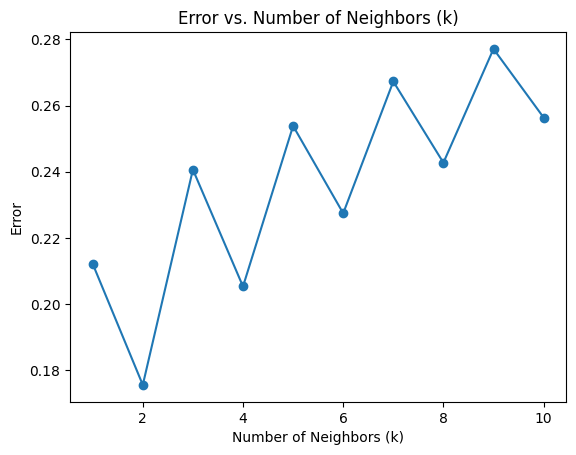

In [ ]:
k_values = np.arange(1, 11)
accuracy_scores = []
error = []

for k in tqdm(k_values):
    knn_classifier = KNeighborsClassifier(n_neighbors=k)
    knn_classifier.fit(X_train, y_train)
    y_pred = knn_classifier.predict(X_test)
    error_ = 1 - accuracy_score(y_test, y_pred)
    error.append(error_)

# Plotting the results
plt.plot(k_values, error, marker='o')
plt.title('Error vs. Number of Neighbors (k)')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('Error')
plt.grid(False)
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



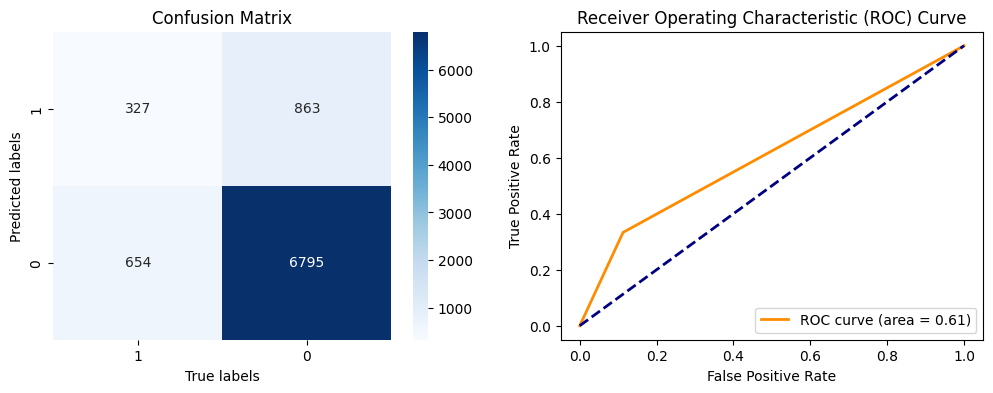

{'True Positive': 327, 'False Positive': 863, 'False Negative': 654, 'True Negative': 6795, 'Accuracy': 0.824400972334761, 'Precision': 0.2747899159663866, 'Recall': 0.3333333333333333, 'F1 Score': 0.30124366651312756, 'False Negative Rate': 0.6666666666666666, 'ROC AUC': 0.6103203621485157}


In [ ]:
knn_classifier = KNeighborsClassifier(n_neighbors=2)
knn_classifier.fit(X_train, y_train)
y_pred = knn_classifier.predict(X_test)

metrics = calculate_and_plot_metrics(y_test, y_pred)
print(metrics)

### Logistic Regression

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the 

Best Parameters: {'C': 0.1, 'penalty': 'l2'}


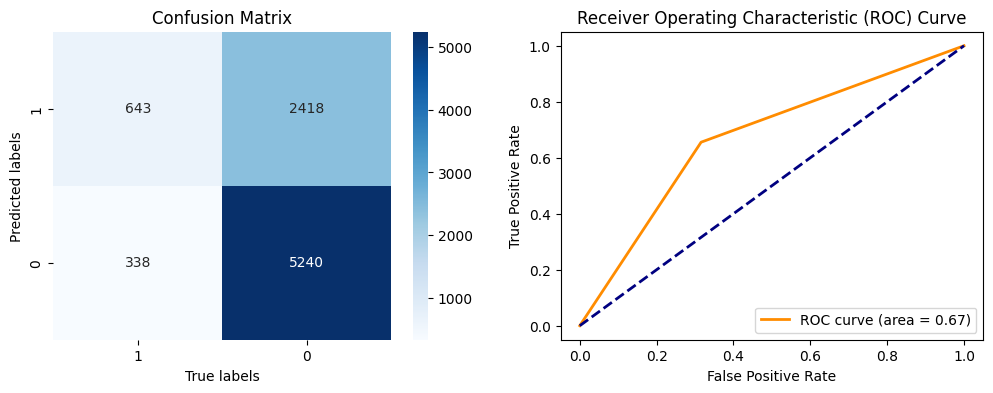

{'True Positive': 643, 'False Positive': 2418, 'False Negative': 338, 'True Negative': 5240, 'Accuracy': 0.6809815950920245, 'Precision': 0.21006207121855602, 'Recall': 0.6554536187563711, 'F1 Score': 0.31815932706580896, 'False Negative Rate': 0.34454638124362896, 'ROC AUC': 0.6698526908093686}


In [ ]:

#Hypertuning using GridSearch

param_grid = {'C': [0.001, 0.01, 0.1, 1, 10, 100],
              'penalty': ['l1', 'l2']}

model = LogisticRegression()
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='accuracy')

grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

y_pred = best_model.predict(X_test)

print(f"Best Parameters: {best_params}")

metrics = calculate_and_plot_metrics(y_test, y_pred)
print(metrics)

### Naive Bayes

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



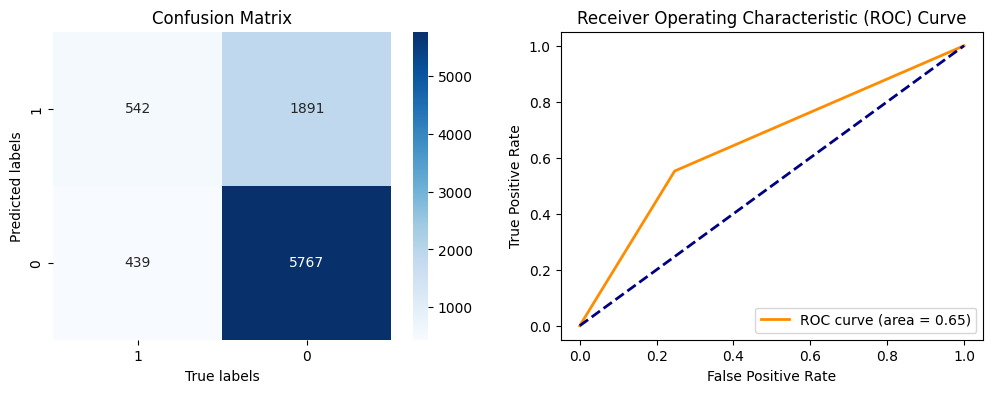

{'True Positive': 542, 'False Positive': 1891, 'False Negative': 439, 'True Negative': 5767, 'Accuracy': 0.7302928579696725, 'Precision': 0.22277024249897245, 'Recall': 0.5524974515800204, 'F1 Score': 0.3175161101347393, 'False Negative Rate': 0.4475025484199796, 'ROC AUC': 0.6527830689605508}


In [ ]:

naive_bayes = GaussianNB()

naive_bayes.fit(X_train, y_train)


y_pred = naive_bayes.predict(X_test)

metrics = calculate_and_plot_metrics(y_test, y_pred)
print(metrics)


### Decision Trees

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Best Parameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2}


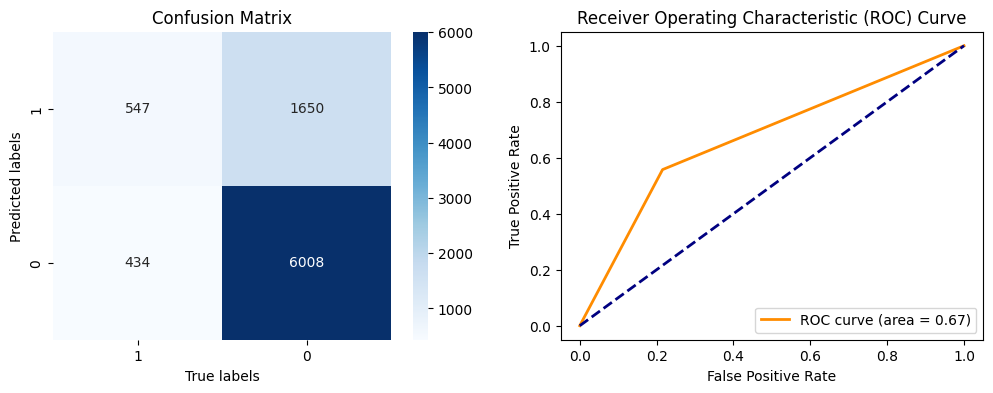

{'True Positive': 547, 'False Positive': 1650, 'False Negative': 434, 'True Negative': 6008, 'Accuracy': 0.7587683759694409, 'Precision': 0.2489758761948111, 'Recall': 0.5575942915392457, 'F1 Score': 0.34424166142227813, 'False Negative Rate': 0.44240570846075433, 'ROC AUC': 0.6710666678380479}


In [ ]:

param_grid = {
    'max_depth': [3, 5, 7, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}


dt_classifier = DecisionTreeClassifier()


grid_search = GridSearchCV(dt_classifier, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Get the best parameters and model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

# Make predictions on the test set using the best model
y_pred = best_model.predict(X_test)


print(f"Best Parameters: {best_params}")

metrics = calculate_and_plot_metrics(y_test, y_pred)
print(metrics)

### Random Forest

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Best Parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


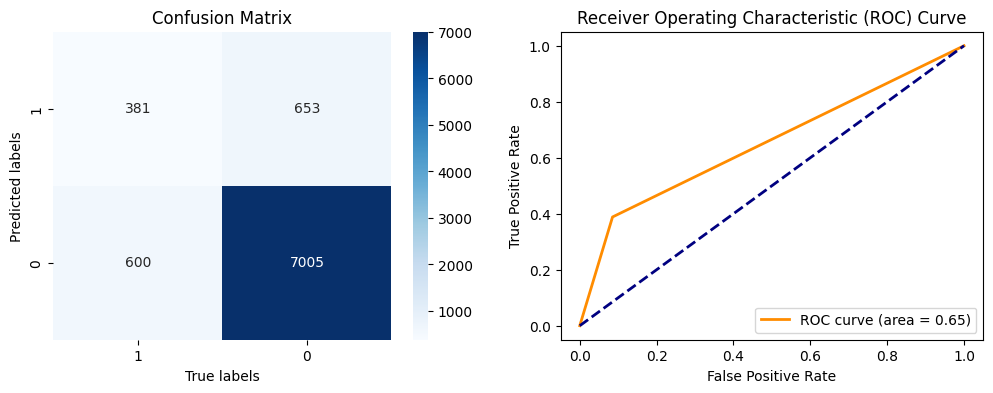

{'True Positive': 381, 'False Positive': 653, 'False Negative': 600, 'True Negative': 7005, 'Accuracy': 0.8549600648223173, 'Precision': 0.36847195357833656, 'Recall': 0.38837920489296635, 'F1 Score': 0.3781637717121588, 'False Negative Rate': 0.6116207951070336, 'ROC AUC': 0.6515544496650781}


In [ ]:

param_grid = {
    'n_estimators': [100, 200],  # Number of trees in the forest
    'max_depth': [None, 5],  # Maximum depth of the trees
    'min_samples_split': [2, 5],  # Minimum samples required to split a node
    'min_samples_leaf': [1, 2]  # Minimum samples required at each leaf node
}

rf_classifier = RandomForestClassifier()


grid_search = GridSearchCV(rf_classifier, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)


best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

y_pred = best_model.predict(X_test)

print(f"Best Parameters: {best_params}")

metrics = calculate_and_plot_metrics(y_test, y_pred)
print(metrics)



### Perceptron

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Best Parameters: {'alpha': 0.0001, 'eta0': 0.1, 'max_iter': 100}


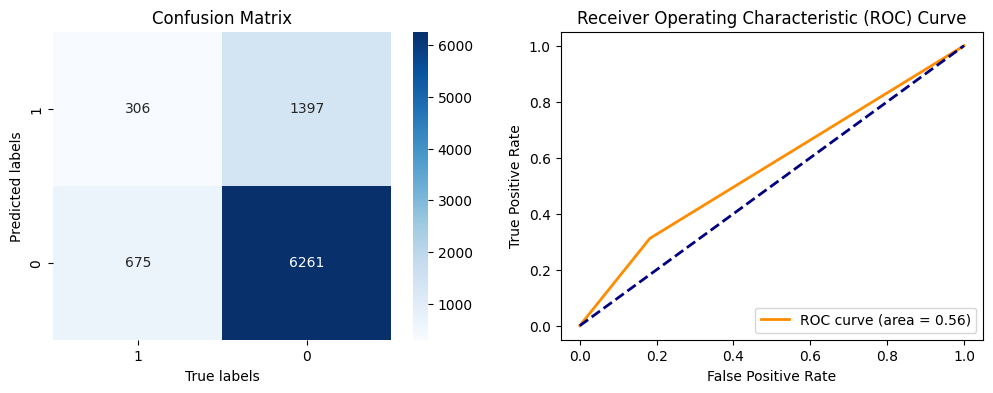

{'True Positive': 306, 'False Positive': 1397, 'False Negative': 675, 'True Negative': 6261, 'Accuracy': 0.7601574256279662, 'Precision': 0.17968291250733998, 'Recall': 0.3119266055045872, 'F1 Score': 0.22801788375558865, 'False Negative Rate': 0.6880733944954128, 'ROC AUC': 0.5647514981035602}


In [ ]:
perceptron = Perceptron()

param_grid = {
    'alpha': [0.0001, 0.001, 0.01],
    'max_iter': [100, 500, 1000],
    'eta0': [0.1, 0.01, 0.001]
}

grid_search = GridSearchCV(perceptron, param_grid, cv=5)
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_

best_perceptron = Perceptron(**best_params)
best_perceptron.fit(X_train, y_train)

y_pred = best_perceptron.predict(X_test)



print("Best Parameters:", best_params)



metrics = calculate_and_plot_metrics(y_test, y_pred)
print(metrics)

### Multiple Layer Perceptron

In [ ]:
mlp = MLPClassifier()

param_grid = {
    'hidden_layer_sizes': [(50,50), (100,100)],
    'activation': ['relu', 'logistic'],
    'solver': ['sgd', 'adam'],
    'max_iter': [100]  # Reducing the max_iter values
}

# Create GridSearchCV object and fit it to the data
grid_search = GridSearchCV(mlp, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_


y_pred = best_model.predict(X_test)


print(f"Best Parameters: {best_params}")




/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.

/usr/local/lib/python3.10/dist

Best Parameters: {'activation': 'relu', 'hidden_layer_sizes': (100, 100), 'max_iter': 100, 'solver': 'adam'}


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



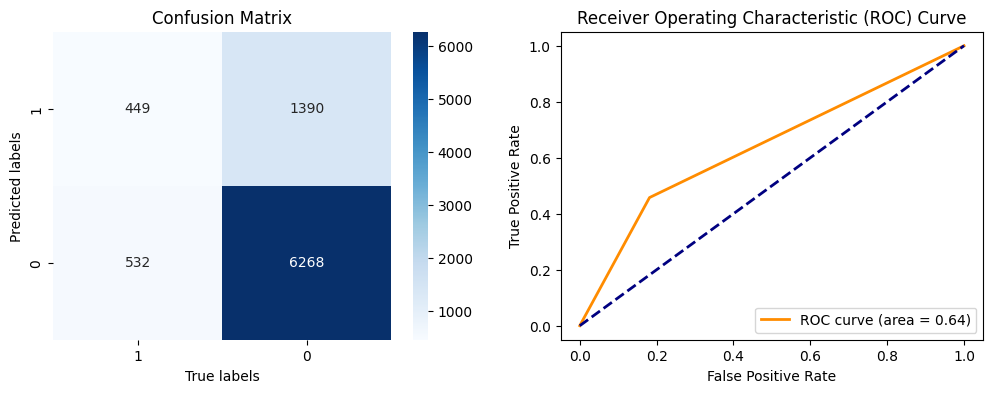

{'True Positive': 449, 'False Positive': 1390, 'False Negative': 532, 'True Negative': 6268, 'Accuracy': 0.7775205463595324, 'Precision': 0.24415443175638935, 'Recall': 0.45769622833843016, 'F1 Score': 0.3184397163120567, 'False Negative Rate': 0.5423037716615698, 'ROC AUC': 0.6380933479117066}


In [ ]:
mlp = MLPClassifier(hidden_layer_sizes=(50, 50), activation='relu', solver='adam', random_state=42)


mlp.fit(X_train, y_train)

y_pred = mlp.predict(X_test)





metrics = calculate_and_plot_metrics(y_test, y_pred)
print(metrics)

### SVM

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



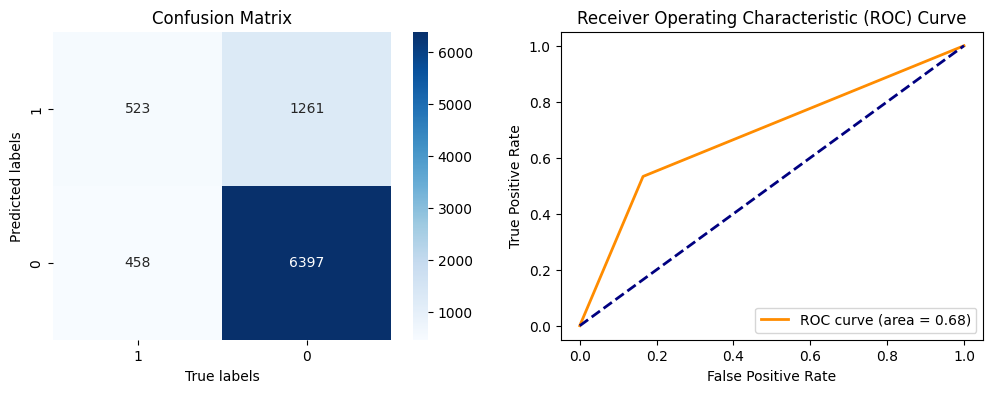

{'True Positive': 523, 'False Positive': 1261, 'False Negative': 458, 'True Negative': 6397, 'Accuracy': 0.8010186364162519, 'Precision': 0.29316143497757846, 'Recall': 0.5331294597349643, 'F1 Score': 0.3783001808318264, 'False Negative Rate': 0.46687054026503566, 'ROC AUC': 0.6842325282482604}


In [ ]:


svm = SVC(probability=True)
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)

# accuracy = accuracy_score(y_test, y_pred)
# precision = precision_score(y_test, y_pred)
# recall = recall_score(y_test, y_pred)
# f1 = f1_score(y_test, y_pred)

# print(f"Accuracy: {accuracy:.4f}")
# print(f"Precision: {precision:.4f}")
# print(f"Recall: {recall:.4f}")
# print(f"F1-score: {f1:.4f}")


metrics = calculate_and_plot_metrics(y_test, y_pred)
print(metrics)

In [ ]:
# y_prob = svm.predict_proba(X_test)[:, 1]

# # calculate the ROC curve
# fpr, tpr, thresholds = roc_curve(y_test, y_prob)
# roc_auc = auc(fpr, tpr)

# # plot ROC curve
# plt.figure()
# plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
# plt.plot([0, 1], [0, 1], color='red', linestyle='--')
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('Receiver Operating Characteristic (ROC) Curve')
# plt.legend(loc="lower right")
# plt.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# #calculate Confusion Matrix
# conf_matrix = confusion_matrix(y_test, y_pred)

# plt.figure(figsize=(6, 4))
# sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='BuPu')
# plt.xlabel('Predicted labels')
# plt.ylabel('True labels')
# plt.title('Confusion Matrix')
# plt.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# **Apriori**

In [ ]:
df["duration"]=duration_data

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
df.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,age,job,marital,education,default,balance,housing,loan,contact,day,pdays,y,month_numeric,duration
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,1,no,5,261
1,44,technician,single,secondary,no,29,yes,no,unknown,5,1,no,5,151
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,1,no,5,76
5,35,management,married,tertiary,no,231,yes,no,unknown,5,1,no,5,139
6,28,management,single,tertiary,no,447,yes,yes,unknown,5,1,no,5,217


In [ ]:
#Discretizing:

#df['duration'] = np.where(df['duration'] <= 0, '0', '1')
df['duration']=pd.qcut(df['duration'], q=4, labels=['Very Short Calls', 'Short Calls', 'Medium-length Calls', 'Long Calls'])
df['balance'] = pd.qcut(df['balance'], q=3, labels=['low', 'med', 'high'])
custom_bins = [0, 18, 38, 59, float('inf')]
df['age'] = pd.cut(df['age'], bins=custom_bins, labels=['Minors', 'Young Adults', 'Midlle Aged Adults', 'Seniors'])
df['day'] = np.where(df['day'] <= 15, 'First Half of Month', 'Second Half of Month')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
#encoding
encoded_df = pd.get_dummies(df, columns=['age','day','balance','job','marital','education', 'default', 'housing','loan','contact','duration','pdays']) #removed poutcome pdays

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
target_column="y"
X = encoded_df.drop(columns=[target_column])
y = encoded_df[target_column]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
X_= pd.get_dummies(X_resampled, columns=['month_numeric'])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
df_apriori=pd.concat([X_,y_resampled],axis=1)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
df_final= pd.get_dummies(df_apriori, columns=['y'])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
for column in df_final.columns:
    unique_values = df_final[column].unique()

    print(f"Unique values in {column}:")
    for value in unique_values:
        print(value)
    print("\n")

Unique values in age_Minors:
0
1


Unique values in age_Young Adults:
0
1


Unique values in age_Midlle Aged Adults:
1
0


Unique values in age_Seniors:
0
1


Unique values in day_First Half of Month:
1
0


Unique values in day_Second Half of Month:
0
1


Unique values in balance_low:
0
1


Unique values in balance_med:
0
1


Unique values in balance_high:
1
0


Unique values in job_admin.:
0
1


Unique values in job_blue-collar:
0
1


Unique values in job_entrepreneur:
0
1


Unique values in job_housemaid:
0
1


Unique values in job_management:
1
0


Unique values in job_retired:
0
1


Unique values in job_self-employed:
0
1


Unique values in job_services:
0
1


Unique values in job_student:
0
1


Unique values in job_technician:
0
1


Unique values in job_unemployed:
0
1


Unique values in marital_divorced:
0
1


Unique values in marital_married:
1
0


Unique values in marital_single:
0
1


Unique values in education_primary:
0
1


Unique values in education_secondary:
0
1


Unique 

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
frequent_itemsets = apriori(df_final, min_support=0.3, use_colnames=True)
frequent_itemsets


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



,support,itemsets
0,0.493516,(age_Young Adults)
1,0.410445,(age_Midlle Aged Adults)
2,0.494669,(day_First Half of Month)
3,0.478558,(day_Second Half of Month)
4,0.314222,(balance_med)
...,...,...
188,0.326784,"(contact_cellular, pdays_1, loan_no, default_n..."
189,0.314131,"(day_First Half of Month, contact_cellular, pd..."
190,0.330085,"(marital_married, contact_cellular, pdays_1, l..."
191,0.366826,"(contact_cellular, pdays_1, loan_no, housing_n..."


In [ ]:
itemset_counts = frequent_itemsets['itemsets'].apply(lambda x: len(x)).value_counts().sort_index()

print("Number of Itemsets by Item Count:")
print(itemset_counts)

Number of Itemsets by Item Count:
1    19
2    61
3    73
4    35
5     5
Name: itemsets, dtype: int64


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.5)

print(rules)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



             antecedents                                       consequents  \
0     (age_Young Adults)                                      (default_no)   
1     (age_Young Adults)                                         (loan_no)   
2     (contact_cellular)                                (age_Young Adults)   
3     (age_Young Adults)                                (contact_cellular)   
4     (age_Young Adults)                                         (pdays_1)   
..                   ...                                               ...   
786     (y_yes, pdays_1)           (contact_cellular, default_no, loan_no)   
787     (y_yes, loan_no)           (contact_cellular, pdays_1, default_no)   
788  (y_yes, default_no)              (contact_cellular, pdays_1, loan_no)   
789   (contact_cellular)             (y_yes, pdays_1, default_no, loan_no)   
790              (y_yes)  (contact_cellular, pdays_1, default_no, loan_no)   

     antecedent support  consequent support   support  confiden

In [ ]:
# Filter rules related to the target variable
target_variable = 'y_yes'
target_rules = rules[rules['consequents'].apply(lambda x: target_variable in x)]
target_rules

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
53,(default_no),(y_yes),0.985500,0.500000,0.495114,0.502399,1.004798,0.002364,1.004821,0.329325
60,(housing_no),(y_yes),0.513675,0.500000,0.307320,0.598276,1.196552,0.050482,1.244636,0.337769
71,(loan_no),(y_yes),0.864547,0.500000,0.451443,0.522173,1.044346,0.019170,1.046404,0.313492
76,(contact_cellular),(y_yes),0.725807,0.500000,0.410785,0.565971,1.131941,0.047882,1.151996,0.425109
79,(duration_Long Calls),(y_yes),0.406830,0.500000,0.306940,0.754467,1.508935,0.103525,2.036389,0.568607
84,(pdays_1),(y_yes),1.000000,0.500000,0.500000,0.500000,1.000000,0.000000,1.000000,0.000000
247,"(housing_no, default_no)",(y_yes),0.507178,0.500000,0.305368,0.602092,1.204184,0.051779,1.256572,0.344063
249,(housing_no),"(y_yes, default_no)",0.513675,0.495114,0.305368,0.594477,1.200686,0.051040,1.245023,0.343685
277,"(default_no, loan_no)",(y_yes),0.855077,0.500000,0.447946,0.523866,1.047733,0.020408,1.050125,0.314362
279,(loan_no),"(y_yes, default_no)",0.864547,0.495114,0.447946,0.518128,1.046482,0.019896,1.047759,0.327916


In [ ]:
# Filter rules related to the target variable
target_variable = 'y_no'
target_rules1= rules[rules['consequents'].apply(lambda x: target_variable in x)]
target_rules1

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
29,(marital_married),(y_no),0.553233,0.500000,0.305761,0.552680,1.105360,0.029144,1.117768,0.213350
81,(pdays_1),(y_no),1.000000,0.500000,0.500000,0.500000,1.000000,0.000000,1.000000,0.000000
179,"(marital_married, default_no)",(y_no),0.545924,0.500000,0.300364,0.550194,1.100389,0.027402,1.111591,0.200914
182,(marital_married),"(default_no, y_no)",0.553233,0.490386,0.300364,0.542925,1.107140,0.029067,1.114948,0.216604
198,"(marital_married, pdays_1)",(y_no),0.553233,0.500000,0.305761,0.552680,1.105360,0.029144,1.117768,0.213350
201,(marital_married),"(pdays_1, y_no)",0.553233,0.500000,0.305761,0.552680,1.105360,0.029144,1.117768,0.213350
497,"(marital_married, pdays_1, default_no)",(y_no),0.545924,0.500000,0.300364,0.550194,1.100389,0.027402,1.111591,0.200914
501,"(marital_married, pdays_1)","(default_no, y_no)",0.553233,0.490386,0.300364,0.542925,1.107140,0.029067,1.114948,0.216604
502,"(marital_married, default_no)","(pdays_1, y_no)",0.545924,0.500000,0.300364,0.550194,1.100389,0.027402,1.111591,0.200914
506,(marital_married),"(pdays_1, default_no, y_no)",0.553233,0.490386,0.300364,0.542925,1.107140,0.029067,1.114948,0.216604


### Choosing Support and Confidence Thresholds

In [ ]:
confidence_levels = [0.5, 0.6, 0.7, 0.8,0.9,1]
support_levels = [30, 40,50,60,70,80]

data = {'Support Level': [], 'Confidence Level': [], 'Number of Rules Found': []}

# looping through each support and confidence levels to calculate the number of rules found
for sup in support_levels:
    for conf in confidence_levels:
        num_rules = len(rules[(rules['confidence'] >= conf) & (rules['support'] >= sup / 100)])
        data['Support Level'].append(f'{sup}%')
        data['Confidence Level'].append(conf)
        data['Number of Rules Found'].append(num_rules)

df = pd.DataFrame(data)

fig = px.line(df, x='Confidence Level', y='Number of Rules Found', color='Support Level', template="plotly_white",
              labels={'Confidence Level': 'Confidence Level', 'Number of Rules Found': 'Number of Rules Found'},
              title='Apriori with Different Support & Confidence Levels', color_discrete_sequence=px.colors.qualitative.Pastel)

fig.update_traces(mode='markers+lines', marker=dict(symbol='circle', size=6))
fig.show()



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:

#heatmap of graph

fig = go.Figure(data=[go.Scatter3d(
    x=df['Confidence Level'],
    y=[f'{sup}%' for sup in df['Support Level']],
    z=df['Number of Rules Found'],
    mode='markers',
    marker=dict(
        size=5,
        color=df['Number of Rules Found'],
        colorscale='Viridis',
        colorbar=dict(title='Number of Rules Found')
    )
)])

fig.update_layout(title='Apriori with Different Support and Confidence Levels',
                  scene=dict(
                      xaxis_title='Confidence Level',
                      yaxis_title='Support Level',
                      zaxis_title='Number of Rules Found'
                  ))

fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



## Visualizing Association Rules of Target Variable

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



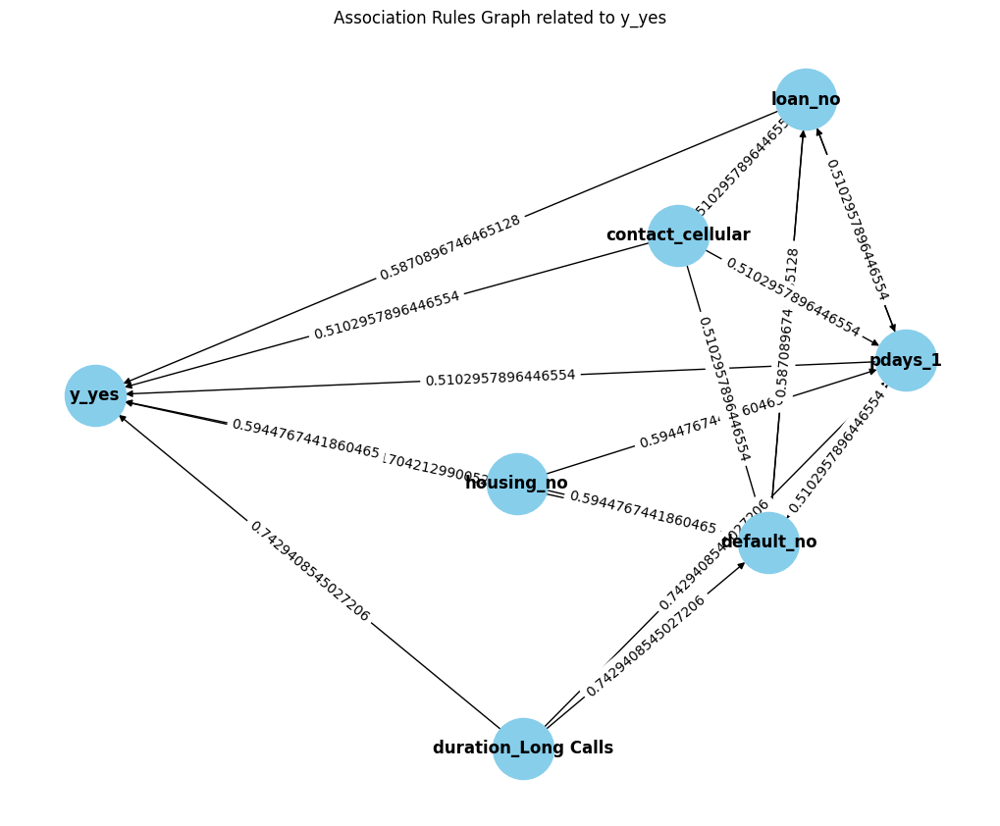

In [ ]:
frequent_itemsets = apriori(df_final, min_support=0.3, use_colnames=True)
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.5)


target_rules = rules[rules['consequents'].astype(str).str.contains("'y_yes'")]


G = nx.DiGraph()

# nodes = items
for idx, row in target_rules.iterrows():
    antecedents = list(row['antecedents'])
    consequents = list(row['consequents'])
    G.add_nodes_from(antecedents)
    G.add_nodes_from(consequents)

# edges = rules
for idx, row in target_rules.iterrows():
    antecedents = list(row['antecedents'])
    consequents = list(row['consequents'])
    for antecedent in antecedents:
        for consequent in consequents:
            G.add_edge(antecedent, consequent, label=row['confidence'])


pos = nx.spring_layout(G)

plt.figure(figsize=(10, 8))
nx.draw(G, pos, with_labels=True, node_size=2000, node_color='skyblue', font_weight='bold')
edge_labels = {(n1, n2): G[n1][n2]['label'] for (n1, n2) in G.edges()}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
plt.title('Association Rules Graph related to y_yes')
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



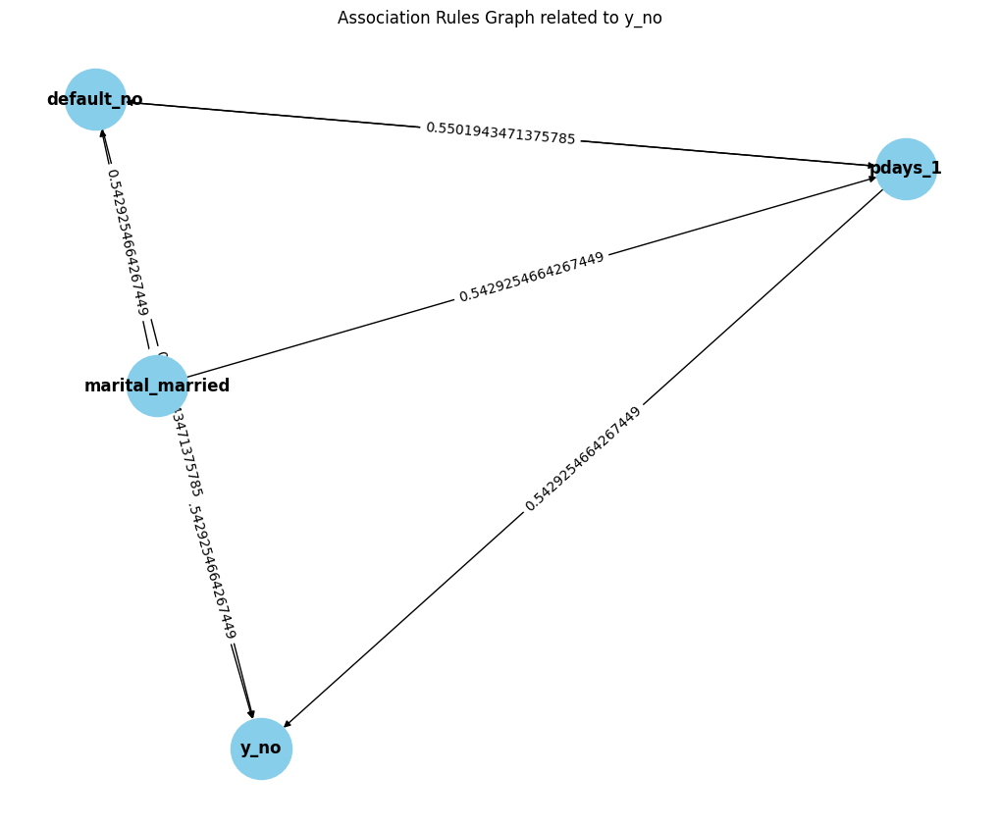

In [ ]:

target_rules = rules[rules['consequents'].astype(str).str.contains("'y_no'")]


G = nx.DiGraph()

# nodes = items
for idx, row in target_rules.iterrows():
    antecedents = list(row['antecedents'])
    consequents = list(row['consequents'])
    G.add_nodes_from(antecedents)
    G.add_nodes_from(consequents)

# edges = rules
for idx, row in target_rules.iterrows():
    antecedents = list(row['antecedents'])
    consequents = list(row['consequents'])
    for antecedent in antecedents:
        for consequent in consequents:
            G.add_edge(antecedent, consequent, label=row['confidence'])


pos = nx.spring_layout(G)

plt.figure(figsize=(10, 8))
nx.draw(G, pos, with_labels=True, node_size=2000, node_color='skyblue', font_weight='bold')
edge_labels = {(n1, n2): G[n1][n2]['label'] for (n1, n2) in G.edges()}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
plt.title('Association Rules Graph related to y_no')
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



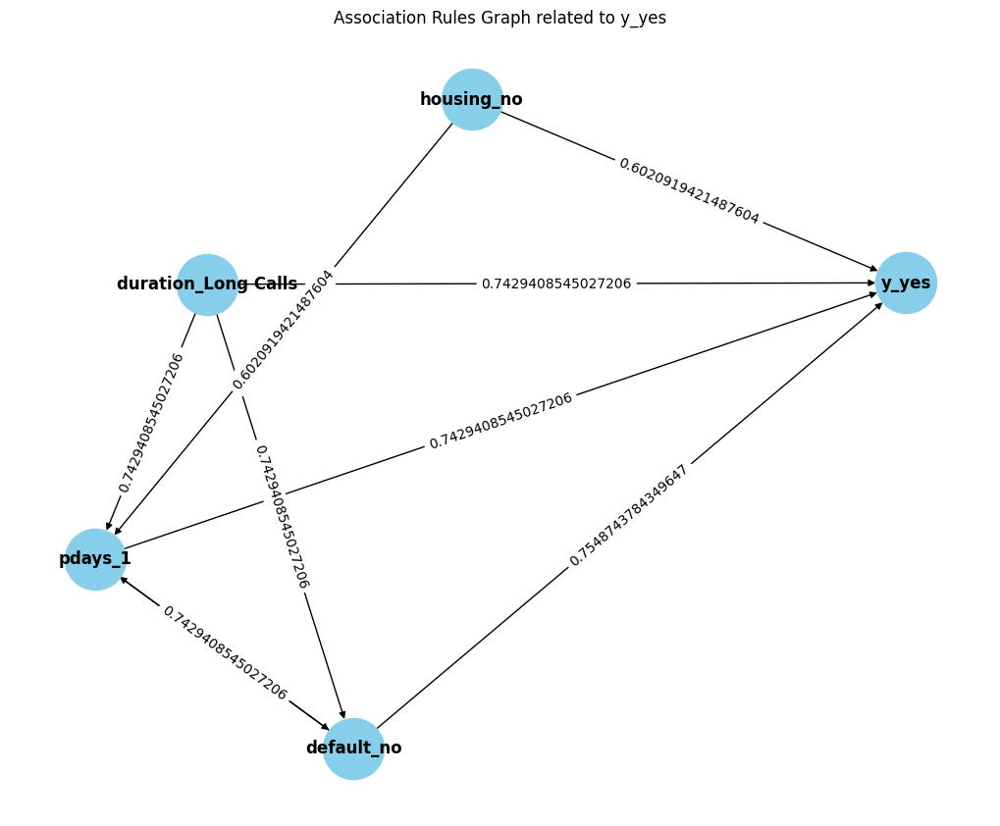

In [ ]:
#increasing confidence to prune redundant rules
frequent_itemsets = apriori(df_final, min_support=0.3, use_colnames=True)
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.6)


target_rules = rules[rules['consequents'].astype(str).str.contains("'y_yes'")]


G = nx.DiGraph()

# nodes = items
for idx, row in target_rules.iterrows():
    antecedents = list(row['antecedents'])
    consequents = list(row['consequents'])
    G.add_nodes_from(antecedents)
    G.add_nodes_from(consequents)

# edges = rules
for idx, row in target_rules.iterrows():
    antecedents = list(row['antecedents'])
    consequents = list(row['consequents'])
    for antecedent in antecedents:
        for consequent in consequents:
            G.add_edge(antecedent, consequent, label=row['confidence'])


pos = nx.spring_layout(G)

plt.figure(figsize=(10, 8))
nx.draw(G, pos, with_labels=True, node_size=2000, node_color='skyblue', font_weight='bold')
edge_labels = {(n1, n2): G[n1][n2]['label'] for (n1, n2) in G.edges()}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
plt.title('Association Rules Graph related to y_yes')
plt.show()

In [ ]:

target_rules = rules[rules['consequents'].astype(str).str.contains("'y_yes'")]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
target_rules

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
64,(duration_Long Calls),(y_yes),0.406830,0.500000,0.306940,0.754467,1.508935,0.103525,2.036389,0.568607
201,"(housing_no, default_no)",(y_yes),0.507178,0.500000,0.305368,0.602092,1.204184,0.051779,1.256572,0.344063
247,"(duration_Long Calls, default_no)",(y_yes),0.400398,0.500000,0.302250,0.754874,1.509749,0.102051,2.039770,0.563104
249,(duration_Long Calls),"(y_yes, default_no)",0.406830,0.495114,0.302250,0.742941,1.500544,0.100823,1.964084,0.562360
300,"(duration_Long Calls, pdays_1)",(y_yes),0.406830,0.500000,0.306940,0.754467,1.508935,0.103525,2.036389,0.568607
302,(duration_Long Calls),"(y_yes, pdays_1)",0.406830,0.500000,0.306940,0.754467,1.508935,0.103525,2.036389,0.568607
465,"(housing_no, pdays_1, default_no)",(y_yes),0.507178,0.500000,0.305368,0.602092,1.204184,0.051779,1.256572,0.344063
470,"(housing_no, default_no)","(y_yes, pdays_1)",0.507178,0.500000,0.305368,0.602092,1.204184,0.051779,1.256572,0.344063
538,"(duration_Long Calls, pdays_1, default_no)",(y_yes),0.400398,0.500000,0.302250,0.754874,1.509749,0.102051,2.039770,0.563104
541,"(duration_Long Calls, pdays_1)","(y_yes, default_no)",0.406830,0.495114,0.302250,0.742941,1.500544,0.100823,1.964084,0.562360


In [ ]:
target_rules.to_csv('final.csv',index=False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

